# Model evaluation

In [1]:
import pandas as pd 
import numpy as np

from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt

import sys
sys.path.append("..")

from src.support.data_transformation import FileHandler
import src.support.data_visualization as dv
import plotly.express as px

from xgboost import XGBClassifier

- Inspect for columns to drop
    - From OHLCV he leaves only volume to generate ln(Volume). I will have both to analyze the impact.
    - He drops all categoricals, OHLCV and 'Year','Date','index_x', 'index_y', 'index', 'Quarter','Adj Close_y'.
- Differentiates categorical
- Differentiates custom from tech ind
- Checks the differences in date ranges for symbols. He truncates to start from 2000 (I doubt how much sense that makes)
- Generates dummies for categoricals. I wonder if I should do that for different months or if I should use cycle features. Some months might be important. Also weekdays, etc.
    He says to generate combinations between months and weekdays?
- Generate dummies for tickers. For the all together model is necessary, but I think I should use a different encoding, like hash.
- For this model, feature selection is going to be key.
- Determine targets (for him ['growth_future_5d', 'is_positive_growth_5d_future'])
- Train/val/test split
- "Rule" prediction strategies

Then... EDA
- He performs correlation Analysis


TO-DO:
- [ ] Add fees
Fixed Pricing:

A fixed commission of $0.005 per share.
Minimum commission per order: $1.00.
Maximum commission per order: 1% of the trade value.
Example: For an order of 100 shares at $25 per share, the commission would be $0.50 (100 shares x $0.005), but since the minimum is $1.00, you'd be charged $1.00.

# 1. Introduction and purpose

## 1st approach - general purpose (all stocks) single point prediction: 7d growth regression and classification

### Data import

In [2]:
general_df = pd.read_parquet("../data/transformed/dataset.parquet")

In [3]:
general_df.info()
general_df.head(3)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 226954 entries, 0 to 226953
Columns: 213 entries, close to BTC_growth_adj_365d
dtypes: datetime64[ns, UTC](4), datetime64[ns](2), float64(132), int32(66), int64(3), object(6)
memory usage: 311.7+ MB


,close,high,low,open,volume,symbol,country,region,industry,sector,...,brent_oil_growth_adj_7d,brent_oil_growth_adj_30d,brent_oil_growth_adj_90d,brent_oil_growth_adj_365d,BTC_growth_adj_1d,BTC_growth_adj_3d,BTC_growth_adj_7d,BTC_growth_adj_30d,BTC_growth_adj_90d,BTC_growth_adj_365d
0,0.059827,0.062498,0.054485,0.054485,1.031789e+09,MSFT,united_states,US_AMERICA,software-infrastructure,technology,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.061963,0.063032,0.059827,0.059827,3.081600e+08,MSFT,united_states,US_AMERICA,software-infrastructure,technology,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.063032,0.063566,0.061963,0.061963,1.331712e+08,MSFT,united_states,US_AMERICA,software-infrastructure,technology,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Data types seem mostly correct and are convenient. Almost all are numerical except for a few datetimes, as it is to be expected and one object type, "symbol". The symbol is of course important and it will be necessary to perform some kind of encoding to make it ingestible for the model.

**Symbols dates and truncate dataset**

Let's now inspec the different time segments of activity for each symbol.

In [4]:
general_df.groupby(['symbol'])['date'].agg(['min','max','count'])

,min,max,count
symbol,,,
AAPL,1980-12-12 00:00:00+00:00,2025-01-17 00:00:00+00:00,11116
ACN,2001-07-19 00:00:00+00:00,2025-01-17 00:00:00+00:00,5911
AMZN,1997-05-15 00:00:00+00:00,2025-01-17 00:00:00+00:00,6964
ASML,1995-03-15 00:00:00+00:00,2025-01-17 00:00:00+00:00,7513
AVGO,2009-08-06 00:00:00+00:00,2025-01-17 00:00:00+00:00,3888
BHARTIARTL.NS,2002-07-01 00:00:00+00:00,2025-01-20 00:00:00+00:00,5600
BRK-B,1996-05-09 00:00:00+00:00,2025-01-17 00:00:00+00:00,7221
CDI.PA,1992-01-27 00:00:00+00:00,2025-01-20 00:00:00+00:00,8509
GOOG,2004-08-19 00:00:00+00:00,2025-01-17 00:00:00+00:00,5138


The fact that these dates are different mean that their IPOs dates are also different, meaning that they got into the stocks market sooner or later than the others. It is also a good sign, showing that other indices or macroindicators introduced do not broadcast their dates and joins were correct.

To feed the least sparse dataset possible to the model, let us truncate it to start from 2000-01-01.

In [5]:
general_df = general_df[general_df.loc[:,"date"] >= "2000-01-01"]

Now we can observe the truncated ranges from the different symbols. Most stocks will start at 2000-01-01, while others with the latest IPOs will have dates closest to present day.

In [6]:
general_df.groupby(['symbol'])['date'].agg(['min','max','count'])

,min,max,count
symbol,,,
AAPL,2000-01-03 00:00:00+00:00,2025-01-17 00:00:00+00:00,6300
ACN,2001-07-19 00:00:00+00:00,2025-01-17 00:00:00+00:00,5911
AMZN,2000-01-03 00:00:00+00:00,2025-01-17 00:00:00+00:00,6300
ASML,2000-01-03 00:00:00+00:00,2025-01-17 00:00:00+00:00,6300
AVGO,2009-08-06 00:00:00+00:00,2025-01-17 00:00:00+00:00,3888
BHARTIARTL.NS,2002-07-01 00:00:00+00:00,2025-01-20 00:00:00+00:00,5600
BRK-B,2000-01-03 00:00:00+00:00,2025-01-17 00:00:00+00:00,6300
CDI.PA,2000-01-03 00:00:00+00:00,2025-01-20 00:00:00+00:00,6439
GOOG,2004-08-19 00:00:00+00:00,2025-01-17 00:00:00+00:00,5138


**Numerical descriptive summary**

Let us observe data ranges for numerical features to make sure there are no unusual data that could affect model predictions.

Starting from the OHLCV data for each symbol and the lag features generated for the first approach:

In [7]:
general_df.describe().T.head(24)

,count,mean,min,25%,50%,75%,max,std
close,188487.0,199.602213,0.056325,17.440497,51.073063,177.037498,4531.867676,440.675067
high,188487.0,201.815486,0.060222,17.63034,51.606434,179.125747,4570.18267,445.175491
low,188487.0,197.396387,0.055025,17.197172,50.438348,175.0,4490.31839,436.294373
open,188487.0,199.672024,0.055789,17.420001,51.019744,177.196888,4554.010849,440.861373
volume,188487.0,48545399.005772,0.0,1230000.0,3935820.0,18223813.0,9230856000.0,168322467.290589
year,188487.0,2012.659733,2000.0,2007.0,2013.0,2019.0,2025.0,7.078814
month,188487.0,6.54234,1.0,4.0,7.0,10.0,12.0,3.436619
weekday,188487.0,2.013391,0.0,1.0,2.0,3.0,6.0,1.404517
quarter_n,188487.0,2.514184,1.0,2.0,3.0,4.0,4.0,1.115574
quarter,188487,2013-01-13 19:47:34.891849216,2000-01-01 00:00:00,2007-01-01 00:00:00,2013-04-01 00:00:00,2019-04-01 00:00:00,2025-01-01 00:00:00,NaN


Data ranges seem normal. As there are many symbols mixed in here, it is difficult to draw any conclusions. We will leave that for later.

Continuing with the next set of features, we can inspect the ranges of momentum indicators.

In [8]:
general_df.describe().T.iloc[24:63,:]

,count,mean,min,25%,50%,75%,max,std
growth_adj_future_30d,187761.0,1.008029,-2.320678,0.963701,1.015912,1.064043,1.794084,0.103521
is_positive_growth_30d,188487.0,0.581961,0.0,0.0,1.0,1.0,1.0,0.493238
adx,188082.0,23.968091,4.22858,16.740494,21.89167,29.166306,78.010724,9.811934
adxr,187887.0,23.969565,5.124484,17.578299,22.222628,28.560898,73.911043,8.827359
apo,188112.0,0.862763,-175.047542,-0.42273,0.091935,1.132882,191.909064,11.309168
aroon_1,188277.0,43.803052,0.0,7.142857,35.714286,78.571429,100.0,36.118556
aroon_2,188277.0,54.291777,0.0,21.428571,57.142857,92.857143,100.0,36.467061
aroonosc,188277.0,10.488725,-100.0,-50.0,28.571429,64.285714,100.0,63.487772
bop,188487.0,0.006324,-4.326922,-0.454549,0.0,0.467533,2.54903,0.531462
cci,188292.0,14.865401,-466.666667,-70.550204,25.904889,98.052746,466.666667,108.182054


These momentum indicators can have negative values so nothing concerning is seen in these values.

Next, Volume/Volatility/Cycle indicators. Again, same as above, all ranges are normal.

In [9]:
general_df.describe().T.iloc[63:79,:]

,count,mean,min,25%,50%,75%,max,std
ultosc,188067.0,51.560374,0.0,44.505974,51.649226,58.709879,97.311852,10.408336
willr,188292.0,-44.522624,-121.839013,-71.447699,-41.208958,-16.608526,21.296016,30.318158
ad,188487.0,2153089828.878305,-53108809045.536186,11831591.186232,264023547.076309,1130913179.43348,69992286484.822159,10959192811.155628
adosc,188352.0,3819754.915672,-3373806477.8666,-1260171.186899,99812.801748,2267992.228574,4301688717.780766,110981450.681209
obv,188487.0,11503529041.817558,-32880852000.0,91190752.5,552141200.0,5810560415.0,169848641200.0,29204602747.721458
atr,188277.0,4.692809,0.0,0.404765,1.160243,4.236774,135.663055,9.745055
natr,188277.0,2.74216,0.0,1.801918,2.322773,3.170759,48.270341,1.568629
ht_dcperiod,188007.0,22.202664,10.027399,18.234133,21.270665,25.199034,48.983553,5.386444
ht_dcphase,187542.0,134.318026,-44.996577,37.735212,163.011019,205.311416,314.99929,96.641996
ht_phasor_inphase,188007.0,0.501951,-318.18086,-0.568276,0.039635,0.98828,305.676141,12.790996


Inspecting the last group of indicators, let's look at the pattern recognition indicators.

In [10]:
pd.set_option("display.max_rows",61)
general_df.describe().T.iloc[79:140,:]

,count,mean,min,25%,50%,75%,max,std
typprice,188487.0,199.604696,0.057292,17.43921,51.038747,177.040414,4522.76158,440.70632
wclprice,188487.0,199.604075,0.05705,17.440608,51.050001,177.057497,4525.038104,440.69733
cdl2crows,188487.0,-0.101864,-100.0,0.0,0.0,0.0,0.0,3.189993
cdl3blackrows,188487.0,-0.015916,-100.0,0.0,0.0,0.0,0.0,1.261498
cdl3inside,188487.0,0.261556,-100.0,0.0,0.0,0.0,100.0,12.861107
cdl3linestrike,188487.0,0.004775,-100.0,0.0,0.0,0.0,100.0,2.636303
cdl3outside,188487.0,-0.341138,-100.0,0.0,0.0,0.0,100.0,18.877387
cdl3starsinsouth,188487.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
cdl3whitesoldiers,188487.0,0.042443,0.0,0.0,0.0,0.0,100.0,2.059744
cdlabandonedbaby,188487.0,0.001592,-100.0,0.0,0.0,0.0,100.0,1.323174


In [11]:
pd.set_option("display.max_rows",63)
general_df.describe().T.iloc[140:,:]

,count,mean,min,25%,50%,75%,max,std
cdlupsidegap2crows,188487.0,-0.06844,-100.0,0.0,0.0,0.0,0.0,2.61521
cdlxsidegap3methods,188487.0,-0.024935,-100.0,0.0,0.0,0.0,100.0,8.114174
^GSPC_growth_adj_1d,186234.0,1.000313,0.880159,0.995352,1.000636,1.005871,1.1158,0.012073
^GSPC_growth_adj_3d,186234.0,1.000924,0.860941,0.991993,1.002217,1.011002,1.175503,0.019382
^GSPC_growth_adj_7d,186234.0,1.001552,0.816599,0.990212,1.003151,1.014608,1.191112,0.024461
^GSPC_growth_adj_30d,186234.0,1.006836,0.663281,0.983756,1.013293,1.034943,1.250469,0.047786
^GSPC_growth_adj_90d,186234.0,1.020504,0.594021,0.982516,1.032911,1.067894,1.396671,0.077713
^GSPC_growth_adj_365d,186234.0,1.078871,0.511772,1.003445,1.105993,1.174742,1.747797,0.16604
^DJI_growth_adj_1d,186234.0,1.000284,0.870735,0.995507,1.000512,1.005563,1.11365,0.011483
^DJI_growth_adj_3d,186234.0,1.000848,0.857145,0.992368,1.001894,1.010312,1.213009,0.018575


**Duplicated data**

To look for duplicates, let's see if there are duplicated records for symbol and date.

In [12]:
print(f"There are {int(general_df.duplicated(subset=['symbol','date']).sum())} duplicated records.")

There are 0 duplicated records.


**Missing values**

Now lets look for missing values. Growth values are excluded from this check as they are inherently missing at the beginning of each symbol time series due to their lagged nature. Imputation of these lagged values will be 0, as using mean/median or back/forward filling would not make sense. Additionally, XGBoost is able to handle NaN natively, so it might be a better strategy to let the model calculate the best encoding.

In [13]:
missing = general_df.isna().sum().reset_index()
missing.columns = ["feature","n_missing"]

# exclude growth features and features with 0 missing
growth_filter = (~ missing["feature"].str.contains("growth"))
zero_filter = (missing["n_missing"]>0)

pd.set_option("display.max_rows",60)
missing.loc[zero_filter & growth_filter]

,feature,n_missing
24,SMA10,135
25,SMA20,285
28,30d_volatility,435
34,adx,405
35,adxr,600
36,apo,375
37,aroon_1,210
38,aroon_2,210
39,aroonosc,210
41,cci,195


As with the growth features, the SMA, 30d volatility and any other alike depend on lags, so they are not to be taken into account and will as well be imputed. 
Momemtum and cycle indicators indicators also depend on lags, so their missing values are also to be imputed as 0. 

The differences here will probably be with the eur_yld, DGS and VIX features. Let's check them.

In [14]:
general_df[general_df["eur_yld_Y1_prev_2d"].isna()].groupby("date")[["symbol"]].count()

,symbol
date,
2000-01-03 00:00:00+00:00,21
2000-01-04 00:00:00+00:00,21
2000-01-05 00:00:00+00:00,21
2000-01-06 00:00:00+00:00,21
2000-01-07 00:00:00+00:00,21
...,...
2024-12-30 00:00:00+00:00,33
2024-12-31 00:00:00+00:00,32
2025-01-01 00:00:00+00:00,8


In [15]:
pd.set_option("display.max_rows",None)
missing.loc[zero_filter]

# set back to normal
pd.set_option("display.max_rows",40)

The first dates are due to the euro not yet having been established in Europe. Therefore, any record before 2004-09-08 is truly non-existent and should be filled as 0 or left for the algorithm to handle it by itself. However, after that date, a ffil (filling from past dates forward) is appropriate as the most probable reason for missing values is a difference in business days between countries stocks market and the Eurozone reports.

DGS1 is a similar case. Records after truncation coincide with stocks start date. However, differences in stock markets and DGS dates, for 25 years and a multitude of stocks adds up for 7865 records. In this case, a ffil is appropriate too.

Now, let's inspect the VIX case checking if any US stocks show this missing incidence in VIX:

In [16]:
general_df.loc[general_df["VIX_close"].isna(), "symbol"].unique()

array(['MSFT', 'SBIN.NS', 'LT.NS', 'LICI.NS', 'BHARTIARTL.NS',
       'HINDUNILVR.NS', 'RELIANCE.NS', 'TCS.NS', 'ITC.NS', 'CDI.PA',
       'OR.PA', 'RMS.PA', 'MC.PA', 'SIE.DE'], dtype=object)

Not a single stock from the US is in the group of stocks with missing VIX. Which means that the reason for their occurrence is a discord between stock market's opening dates. Therefore, a ffil strategy is again the go-to.

In this case, imputation does not incur in data-leakage, so they can be applied straight away outside a pipelined process.

In [17]:
short_cols = ["eur_yld", "DGS"]
short_cols = ["eur_yld", "DGS", "brent", "crude", "gold", "EPI", "BTC", "^GDAXI", "^DJI", "^GSPC"]
short_cols_pattern = "|".join(short_cols)  

to_ffill = general_df.columns[general_df.columns.str.contains(short_cols_pattern)].to_list()
to_ffill

general_df[to_ffill] = general_df[to_ffill + ["symbol","date"]].groupby(["symbol"])[to_ffill].ffill()

Checking that the first records have not been filled:

In [18]:
general_df[to_ffill]

,EPI_growth_adj_1d,EPI_growth_adj_3d,EPI_growth_adj_7d,EPI_growth_adj_30d,EPI_growth_adj_90d,EPI_growth_adj_365d,eur_yld_Y1_prev_2d,eur_yld_Y10_prev_2d,eur_yld_Y5_prev_2d,DGS1_prev_1d,...,brent_oil_growth_adj_7d,brent_oil_growth_adj_30d,brent_oil_growth_adj_90d,brent_oil_growth_adj_365d,BTC_growth_adj_1d,BTC_growth_adj_3d,BTC_growth_adj_7d,BTC_growth_adj_30d,BTC_growth_adj_90d,BTC_growth_adj_365d
3490,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.98,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3491,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.09,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3492,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3493,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.05,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3494,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.03,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226949,0.986102,0.960071,0.944154,0.905175,0.901227,1.049180,2.33536,2.61630,2.27237,4.25,...,1.061730,1.122178,1.049624,1.046506,1.000297,0.998047,0.994455,0.993813,1.234776,1.496416
226950,1.009935,0.971118,0.970040,0.915505,0.893845,1.058069,2.36144,2.65624,2.32642,4.24,...,1.037248,1.087051,1.043614,1.020820,1.021346,1.020805,1.043791,1.019515,1.257300,1.548638
226951,1.005948,1.001823,0.975377,0.918265,0.895146,1.045433,2.37913,2.68203,2.35564,4.22,...,1.077075,1.117423,1.033123,1.047771,1.041130,1.063670,1.061277,1.018529,1.248903,1.642554
226952,0.998635,1.014556,0.975561,0.925300,0.897203,1.051487,2.37854,2.71869,2.39536,4.19,...,1.077075,1.117423,1.033123,1.047771,0.992562,1.055444,1.054885,1.004609,1.124636,1.582188


The remaining NaNs derived from lags in the begginning of series, or due to series not having started yet, will be imputed with zeros or automatically by XGBoost later.

**Generate cycle date features and monthly dummies**

Cycle features for months, quarter and workweek:

In [19]:
def generate_cyclical_features(value, period):
    sine = np.sin(2 * np.pi * value / period)
    cosine = np.cos(2 * np.pi * value / period)
    return sine, cosine

# Apply transformations
general_df['month_sin'], general_df['month_cos'] = generate_cyclical_features(general_df['month'], 12)
general_df['quarter_sin'], general_df['quarter_cos'] = generate_cyclical_features(general_df['quarter_n'], 4)

# Business days
general_df['weekday_sin'], general_df['weekday_cos'] = generate_cyclical_features(general_df['weekday'], 7)

# general_df.loc[general_df["weekday"]>=5, ['weekday_sin','weekday_cos','weekday']] = np.nan

In [20]:
general_df['weekday'].isna().sum()

0

Generate month dummies:

In [21]:
month_dummy_columns = pd.get_dummies(general_df["date"].dt.month_name()).astype(int)

general_df = pd.concat([general_df,month_dummy_columns],axis=1)

## Analysis

In [22]:
def temporal_split(df, min_date, max_date, train_prop=0.7, val_prop=0.15, test_prop=0.15):
    """
    Splits a DataFrame into three buckets based on the temporal order of the 'Date' column.

    Args:
        df (DataFrame): The DataFrame to split.
        min_date (str or Timestamp): Minimum date in the DataFrame.
        max_date (str or Timestamp): Maximum date in the DataFrame.
        train_prop (float): Proportion of data for training set (default: 0.6).
        val_prop (float): Proportion of data for validation set (default: 0.2).
        test_prop (float): Proportion of data for test set (default: 0.2).

    Returns:
        DataFrame: The input DataFrame with a new column 'split' indicating the split for each row.
    """
    # Define the date intervals
    train_end = min_date + pd.Timedelta(days=(max_date - min_date).days * train_prop)
    val_end = train_end + pd.Timedelta(days=(max_date - min_date).days * val_prop)

    # Assign split labels based on date ranges
    split_labels = []
    for date in df['Date']:
        if date <= train_end:
            split_labels.append('train')
        elif date <= val_end:
            split_labels.append('validation')
        else:
            split_labels.append('test')

    # Add 'split' column to the DataFrame
    df['split'] = split_labels

    return df


general_df_split = temporal_split(general_df, min_date=min(general_df["date"]),  max_date=max(general_df["date"]))

In [23]:
general_df_split.groupby("split").agg(record_count=("symbol","size"))

,record_count
split,
test,30847
train,127474
validation,30166


Target feature

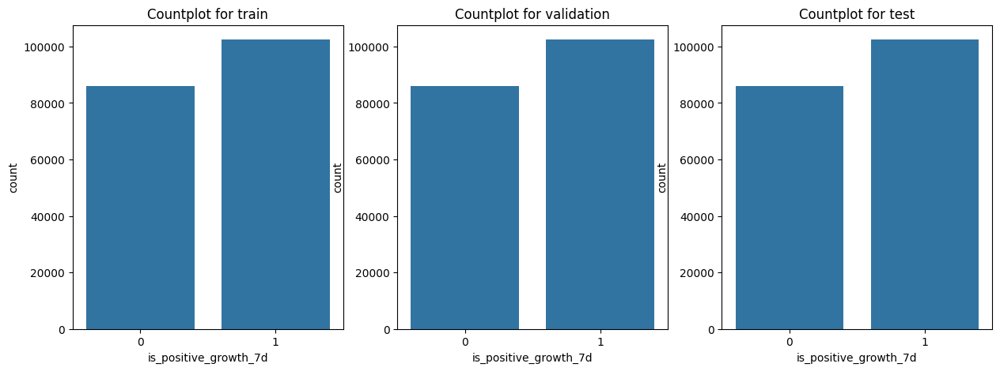

In [24]:
fig, axes = plt.subplots(1,3, figsize=(15,5))
axes = axes.flat

for split, ax in zip(["train","validation","test"],axes):
    ax.set_title(f"Countplot for {split}")
    split_filter = general_df_split["split"] == split
    sns.countplot(data=general_df,
              x="is_positive_growth_7d", ax=ax)

Although there are a few outliers, the growth feature succeeds in getting a similar distribution of target feature data in all 3 sets.

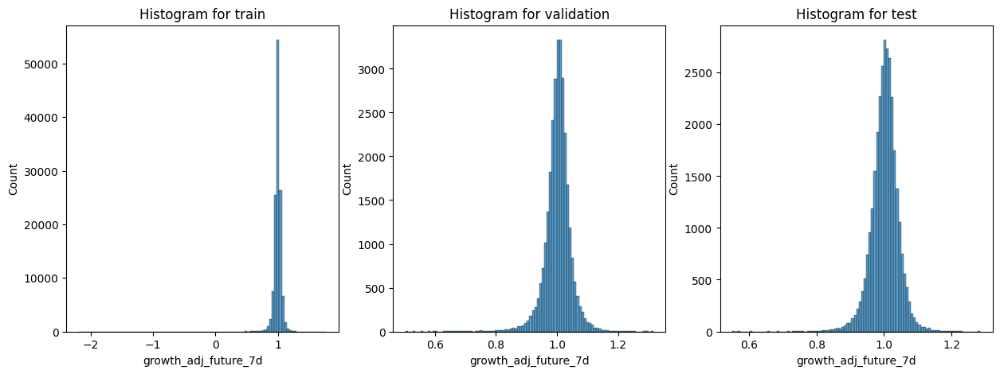

In [25]:
fig, axes = plt.subplots(1,3, figsize=(15,5))
axes = axes.flat

for split, ax in zip(["train","validation","test"],axes):
    ax.set_title(f"Histogram for {split}")
    split_filter = general_df_split["split"] == split
    sns.histplot(data=general_df_split.loc[split_filter],
                x="growth_adj_future_7d", bins=100, ax=ax)

Macroindicators

In [26]:
general_df.select_dtypes("object")

,symbol,country,region,industry,sector,currency,split
3490,MSFT,united_states,US_AMERICA,software-infrastructure,technology,USD,train
3491,MSFT,united_states,US_AMERICA,software-infrastructure,technology,USD,train
3492,MSFT,united_states,US_AMERICA,software-infrastructure,technology,USD,train
3493,MSFT,united_states,US_AMERICA,software-infrastructure,technology,USD,train
3494,MSFT,united_states,US_AMERICA,software-infrastructure,technology,USD,train
...,...,...,...,...,...,...,...
226949,ACN,ireland,EU,information-technology-services,technology,USD,test
226950,ACN,ireland,EU,information-technology-services,technology,USD,test
226951,ACN,ireland,EU,information-technology-services,technology,USD,test
226952,ACN,ireland,EU,information-technology-services,technology,USD,test


In [27]:
stocks_filter = general_df["symbol"].isin(['MSFT', 'AAPL', 'GOOG', 'NVDA', 'AMZN', 'META', 'BRK-B', 'LLY', 'AVGO','V', 'JPM'])
general_df_aggregated = general_df.loc[stocks_filter].drop(columns=general_df.select_dtypes("object").columns).groupby("date").mean()

This below should be replaced by the SNP500

In [28]:
# general_df_aggregated.close.plot.line()

# Dynamic visualisation of VIX volatility
fig = px.line(general_df_aggregated,
              x=general_df_aggregated.index,
              y="close",
              title='stocks over time')

fig.update_layout(title_x=0.5)  # This will center the title horizontally

fig.show()

In [29]:
# Dynamic visualisation of VIX volatility
fig = px.line(general_df_aggregated,
              x=general_df_aggregated.index,
              y="SMA20",
              title='stocks over time')

fig.update_layout(title_x=0.5)  # This will center the title horizontally

fig.show()

In [30]:
# general_df_aggregated.close.plot.line()

# Dynamic visualisation of VIX volatility
fig = px.line(general_df_aggregated,
              x=general_df_aggregated.index,
              y="CPILFESL",
              title='CPI over time')

fig.update_layout(title_x=0.5)  # This will center the title horizontally

fig.show()

In [31]:
# general_df_aggregated.close.plot.line()

# Dynamic visualisation of VIX volatility
fig = px.line(general_df_aggregated,
              x=general_df_aggregated.index,
              y="growth_adj_30d",
              title='VIX over time')

fig.update_layout(title_x=0.5)  # This will center the title horizontally

fig.show()

In [32]:
correlations_market = general_df_aggregated.corr(numeric_only=True)

In [33]:
pd.set_option("display.max_rows",None)
display(correlations_market.loc[:,"close"].sort_values())
pd.set_option("display.max_rows",40)

volume                      -0.525362
eur_yld_Y10_prev_2d         -0.358382
natr                        -0.229286
eur_yld_Y5_prev_2d          -0.226173
high_minus_low_relative     -0.206088
DGS10_prev_1d               -0.189325
gdppot_us_yoy               -0.187687
gdppot_us_qoq               -0.152553
ht_sine_leadsine            -0.121087
VIX_close                   -0.115324
BTC_growth_adj_365d         -0.108948
aroon_1                     -0.083066
cdlhikkake                  -0.045357
ht_sine_sine                -0.041677
cdlshootingstar             -0.038812
month_sin                   -0.034718
cdlstalledpattern           -0.032151
cdlhikkakemod               -0.030169
cdlinvertedhammer           -0.028267
cdlmatchinglow              -0.025845
quarter_sin                 -0.023905
cdl2crows                   -0.022307
March                       -0.021282
cdlgapsidesidewhite         -0.021158
DGS5_prev_1d                -0.018908
cdlhighwave                 -0.018905
BTC_growth_a

In [34]:
pd.set_option("display.max_rows",None)
display(correlations_market.loc[:,"growth_adj_30d"].sort_values())
pd.set_option("display.max_rows",40)

ht_sine_leadsine            -0.604821
aroon_1                     -0.600189
high_minus_low_relative     -0.367443
VIX_close                   -0.360928
natr                        -0.359645
volume                      -0.131809
minus_di                    -0.130229
cdlinvertedhammer           -0.087332
cdldojistar                 -0.082753
ht_sine_sine                -0.076358
crude_oil_growth_adj_365d   -0.062614
gdppot_us_yoy               -0.062347
DGS10_prev_1d               -0.060964
cdladvancedblock            -0.060475
October                     -0.059491
cpi_core_mom_prev_month     -0.058909
gdppot_us_qoq               -0.058414
cdlhangingman               -0.053919
brent_oil_growth_adj_365d   -0.052788
cpi_core_yoy_prev_month     -0.050549
DGS5_prev_1d                -0.047122
August                      -0.046890
July                        -0.039048
eur_yld_Y10_prev_2d         -0.037032
is_positive_growth_7d       -0.036901
cdlcounterattack            -0.036513
gold_growth_

Correlations to check if they are correlated due to being the stock's close price lagged indicator:
- atr
- dm
- minus_di
- CPIFESL
- cpi_core_yoy_prev_month
- ^GSPC_growth_adj_365d 
- apo          
- macd_ext                         
- macdsignal_ext
- EPI_growth_adj_365d               
- ^GSPC_growth_adj_90d            
- FEDFUNDS_prev_month            
- ht_phasor_inphase            
- ^DJI_growth_adj_365d         
- DGS1_prev_1d
negative:
- eur_yld_Y10_prev_2d
- gdppot_us_yoy    
- volume
- high_minus_low_relative       
- VIX_close                                                      

In [35]:
pd.set_option("display.max_rows",None)
display(correlations_market.loc[:,"growth_adj_future_7d"].sort_values())
pd.set_option("display.max_rows",40)

gdppot_us_yoy               -0.088665
DGS10_prev_1d               -0.088547
gdppot_us_qoq               -0.084592
DGS5_prev_1d                -0.081490
brent_oil_growth_adj_365d   -0.070737
volume                      -0.067088
natr                        -0.066648
crude_oil_growth_adj_365d   -0.065961
high_minus_low_relative     -0.056255
fastk_rsi                   -0.050946
cdlclosingmarubozu          -0.050687
fastk                       -0.050500
fastd_rsi                   -0.049648
^GSPC_growth_adj_1d         -0.048246
September                   -0.048082
growth_adj_3d               -0.047851
growth_adj_7d               -0.046661
growth_adj_1d               -0.046587
DGS1_prev_1d                -0.045724
^DJI_growth_adj_1d          -0.043994
slowk                       -0.043600
fastd                       -0.043489
^GSPC_growth_adj_3d         -0.043051
^GSPC_growth_adj_7d         -0.042607
^DJI_growth_adj_7d          -0.040838
eur_yld_Y5_prev_2d          -0.040316
bop         

In [36]:
pd.set_option("display.max_rows",None)
display(correlations_market.loc[:,"growth_adj_future_7d"].sort_values())
pd.set_option("display.max_rows",40)

gdppot_us_yoy               -0.088665
DGS10_prev_1d               -0.088547
gdppot_us_qoq               -0.084592
DGS5_prev_1d                -0.081490
brent_oil_growth_adj_365d   -0.070737
volume                      -0.067088
natr                        -0.066648
crude_oil_growth_adj_365d   -0.065961
high_minus_low_relative     -0.056255
fastk_rsi                   -0.050946
cdlclosingmarubozu          -0.050687
fastk                       -0.050500
fastd_rsi                   -0.049648
^GSPC_growth_adj_1d         -0.048246
September                   -0.048082
growth_adj_3d               -0.047851
growth_adj_7d               -0.046661
growth_adj_1d               -0.046587
DGS1_prev_1d                -0.045724
^DJI_growth_adj_1d          -0.043994
slowk                       -0.043600
fastd                       -0.043489
^GSPC_growth_adj_3d         -0.043051
^GSPC_growth_adj_7d         -0.042607
^DJI_growth_adj_7d          -0.040838
eur_yld_Y5_prev_2d          -0.040316
bop         

In [37]:
pd.set_option("display.max_rows",None)
display(correlations_market.loc[:,"growth_adj_future_30d"].sort_values())
pd.set_option("display.max_rows",40)

brent_oil_growth_adj_365d   -0.180828
gdppot_us_yoy               -0.175493
DGS10_prev_1d               -0.172810
gdppot_us_qoq               -0.168312
DGS5_prev_1d                -0.160966
crude_oil_growth_adj_365d   -0.144571
natr                        -0.130516
high_minus_low_relative     -0.115503
volume                      -0.106340
DGS1_prev_1d                -0.093392
eur_yld_Y5_prev_2d          -0.088007
eur_yld_Y10_prev_2d         -0.082039
gold_growth_adj_365d        -0.074500
FEDFUNDS_prev_month         -0.071987
September                   -0.068056
eur_yld_Y1_prev_2d          -0.067722
ht_trendmod                 -0.066509
EPI_growth_adj_365d         -0.065115
cpi_core_yoy_prev_month     -0.052470
cpi_core_mom_prev_month     -0.052457
July                        -0.048721
adxr                        -0.037385
^DJI_growth_adj_30d         -0.035242
gold_growth_adj_7d          -0.030664
^DJI_growth_adj_1d          -0.030134
January                     -0.029862
cdlhikkake  

In [38]:
pd.set_option("display.max_rows",None)
display(correlations_market.loc[:,"SMA20"].sort_values())
pd.set_option("display.max_rows",40)

volume                      -0.524118
eur_yld_Y10_prev_2d         -0.359523
eur_yld_Y5_prev_2d          -0.227233
natr                        -0.224731
high_minus_low_relative     -0.198962
DGS10_prev_1d               -0.189588
gdppot_us_yoy               -0.187596
gdppot_us_qoq               -0.152112
ht_sine_leadsine            -0.115654
BTC_growth_adj_365d         -0.113853
VIX_close                   -0.106600
aroon_1                     -0.065848
ht_sine_sine                -0.049997
cdlhikkake                  -0.045327
cdlshootingstar             -0.037604
month_sin                   -0.035781
cdlstalledpattern           -0.030604
cdlhikkakemod               -0.030269
macdhist                    -0.027447
macdhist_fix                -0.027433
cdlmatchinglow              -0.025407
cdlinvertedhammer           -0.025305
macdhist_ext                -0.025046
quarter_sin                 -0.024497
BTC_growth_adj_90d          -0.023899
BTC_growth_adj_30d          -0.023282
cdl2crows   

Correlation of macroindicators

Plot cycle indicators for some stocks

In [39]:
# general_df_aggregated.close.plot.line()

# Dynamic visualisation of VIX volatility
fig = px.line(general_df_aggregated,
              x=general_df_aggregated.index,
              y="growth_adj_30d",
              title='VIX over time')

fig.update_layout(title_x=0.5)  # This will center the title horizontally

fig.show()

In [40]:
# general_df_aggregated.close.plot.line()

# Dynamic visualisation of VIX volatility
fig = px.line(general_df_aggregated,
              x=general_df_aggregated.index,
              y="ht_dcperiod",
              title='HT dcperiod over time')

fig.update_layout(title_x=0.5)  # This will center the title horizontally

fig.show()

In [41]:
# general_df_aggregated.close.plot.line()

# Dynamic visualisation of VIX volatility
fig = px.line(general_df_aggregated,
              x=general_df_aggregated.index,
              y="ht_dcphase",
              title='HT dcperiod over time')

fig.update_layout(title_x=0.5)  # This will center the title horizontally

fig.show()

## Modelling

Regression

**Classification**

Models:
- Random Forest
- XGBoost
- NN

Variant:
- Including fees
- Not including fees
- Shorting too
- Grows more than x%

**Generate new features**

In [42]:
general_df["ln_volume"] = np.log(general_df["volume"]).replace(-np.inf,0)
general_df = pd.concat([general_df,pd.get_dummies(general_df["symbol"],prefix="symbol").astype(int)],axis=1)
general_df = pd.concat([general_df,pd.get_dummies(general_df["weekday"].astype(int),prefix="weekday").astype(int)],axis=1)

/home/miguel/data_science/algorithmic_trading/.venv/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning:

divide by zero encountered in log



In [43]:
stocks = {
    # https://companiesmarketcap.com/usa/largest-companies-in-the-usa-by-market-cap/
    "US": ['MSFT', 'AAPL', 'GOOG', 'NVDA', 'AMZN', 'META', 'BRK-B', 'LLY', 'AVGO','V', 'JPM'],

    # https://companiesmarketcap.com/european-union/largest-companies-in-the-eu-by-market-cap/
    "EU": ['NVO','MC.PA', 'ASML', 'RMS.PA', 'OR.PA', 'SAP', 'ACN', 'TTE', 'SIE.DE','IDEXY','CDI.PA'],

    # https://companiesmarketcap.com/india/largest-companies-in-india-by-market-cap/
    "INDIA": ['RELIANCE.NS','TCS.NS','HDB','BHARTIARTL.NS','IBN','SBIN.NS','LICI.NS','INFY','ITC.NS','HINDUNILVR.NS','LT.NS'],
    }

general_df["country_US"] = np.where(general_df["symbol"].isin(stocks["US"]), 1, 0)
general_df["country_EU"] = np.where(general_df["symbol"].isin(stocks["EU"]), 1, 0)
general_df["country_INDIA"] = np.where(general_df["symbol"].isin(stocks["INDIA"]), 1, 0)

**Features to drop**

In [44]:
target_not_used = ["growth_adj_future_7d","growth_adj_future_30d","is_positive_growth_30d"]
feat_not_used = ['Date_x', 
                 'close',
                    'high',
                    'low',
                    'open',
                    'volume',
                    'symbol',
                    'year',
                    'month',
                    'weekday',
                    'quarter_n',
                    'quarter',
                    'month_dt',
                    'date',
                    'Date_y',
                    'Date']

feat_to_drop = target_not_used + feat_not_used

In [45]:
general_df["is_positive_growth_7d"]

3490      0
3491      0
3492      0
3493      0
3494      1
         ..
226949    0
226950    0
226951    0
226952    0
226953    0
Name: is_positive_growth_7d, Length: 188487, dtype: int64

In [46]:
general_df.dropna(subset="growth_adj_future_7d",inplace=True)

**Train-validation-test split**

In [47]:
date = general_df["Date"]

general_df = general_df.drop(columns=feat_to_drop)

In [48]:
object_columns = general_df.select_dtypes("object").columns.to_list()

general_df_train = general_df.loc[general_df["split"] == "train"].copy(deep=True)
general_df_val = general_df.loc[general_df["split"] == "validation"].copy(deep=True)

general_df_train_final = general_df.loc[general_df["split"].isin(["train","validation"])].copy(deep=True)
general_df_test = general_df.loc[general_df["split"] == "test"].copy(deep=True)

y_train, X_train = general_df_train["is_positive_growth_7d"], general_df_train.drop(columns= object_columns+ ["is_positive_growth_7d"]) # clean this mess
y_val, X_val = general_df_val["is_positive_growth_7d"], general_df_val.drop(columns=object_columns+ ["is_positive_growth_7d"])

y_train_final, X_train_final = general_df_train_final["is_positive_growth_7d"], general_df_train_final.drop(columns=object_columns+ ["is_positive_growth_7d"])
y_test, X_test = general_df_test["is_positive_growth_7d"], general_df_test.drop(columns=object_columns+ ["is_positive_growth_7d"])

Fill missing

In [49]:
X_train = X_train.fillna(0)
X_val = X_val.fillna(0)
X_train_final = X_train_final.fillna(0)
X_train = X_train.fillna(0)

**Model**

**XGboost**

In [50]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score, precision_score, accuracy_score, f1_score, recall_score

In [53]:
clf_xgb = XGBClassifier(
    tree_method='hist',
    device="cuda",
    objective="binary:logistic",
    eval_metric="logloss"
)

In [54]:
clf_xgb.fit(X_train_final, y_train_final)
y_probs = clf_xgb.predict_proba(X_test)[:,1]
y_pred = clf_xgb.predict(X_test)
print(y_probs)

[0.60197693 0.628049   0.7200594  ... 0.3161206  0.2959002  0.13290024]


In [55]:
y_probs.shape

(30682,)

In [56]:
y_pred = (y_probs > 0.01).astype(int)

In [57]:
y_pred = (y_probs > 0.01).astype(int)


precisiones = {"prob": [], "precision": []}
for prob in np.arange(0.01,1,0.01):
    y_pred = (y_probs > prob).astype(int)
    precisiones["prob"].append(prob)
    precision = precision_score(y_test, y_pred)
    precisiones["precision"].append(precision)
    if precision == 0:
        print(f"La prob {prob} da problemas")

precisiones_df = pd.DataFrame(precisiones)

La prob 0.97 da problemas
La prob 0.98 da problemas
La prob 0.99 da problemas


/home/miguel/data_science/algorithmic_trading/.venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/miguel/data_science/algorithmic_trading/.venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/miguel/data_science/algorithmic_trading/.venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



In [58]:
precisiones_df.tail(20)

,prob,precision
79,0.80,0.587831
80,0.81,0.576404
81,0.82,0.576873
82,0.83,0.588509
83,0.84,0.602210
84,0.85,0.600887
85,0.86,0.620419
86,0.87,0.600671
87,0.88,0.637168
88,0.89,0.654545


In [59]:
y_pred = (y_probs > 0.85).astype(int)

In [60]:
y_pred.sum()

451

In [61]:
recall_score(y_test, y_pred)

0.016083086053412462

In [62]:
accuracy_score(y_test, y_pred)

0.4537839775764292

In [63]:
f1_score(y_test, y_pred, average="macro")

0.3254929427826109

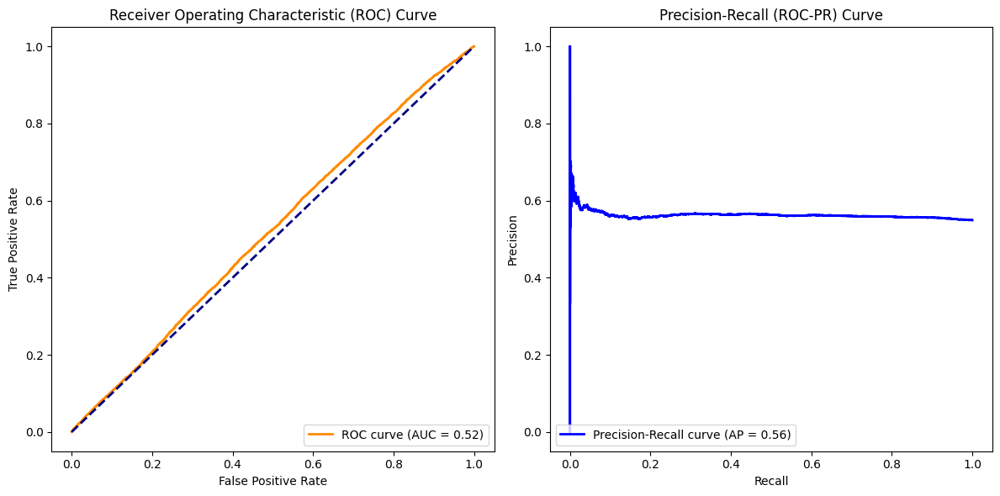

In [64]:
y_true = y_test
y_proba = y_probs


# ROC Curve
fpr, tpr, _ = roc_curve(y_true, y_proba)
roc_auc = auc(fpr, tpr)

# Precision-Recall Curve
precision, recall, _ = precision_recall_curve(y_true, y_proba)
average_precision = average_precision_score(y_true, y_proba)

# Plot ROC Curve
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')

# Plot ROC-PR Curve
plt.subplot(1, 2, 2)
plt.plot(recall, precision, color='blue', lw=2, label=f'Precision-Recall curve (AP = {average_precision:.2f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall (ROC-PR) Curve')
plt.legend(loc='lower left')

plt.tight_layout()
plt.show()


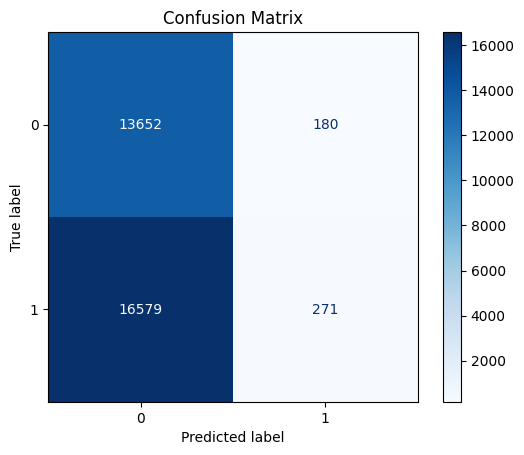

In [65]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(y_true))
disp.plot(cmap=plt.cm.Blues)

# Customize plot
plt.title("Confusion Matrix")
plt.show()


In [66]:
from sklearn.calibration import calibration_curve
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import brier_score_loss
from sklearn.metrics import classification_report

In [67]:
fraccion_positivos, media_prob_predicha = calibration_curve(y_test, y_probs, n_bins=20)

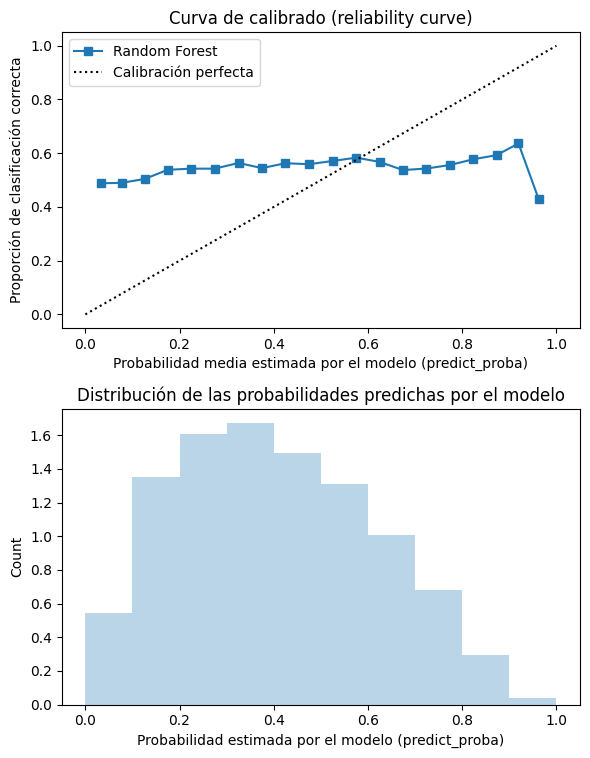

In [68]:
fig, axs = plt.subplots(nrows=2, ncols=1,figsize=(6, 2*3.84))

axs[0].plot(media_prob_predicha, fraccion_positivos, "s-", label="Random Forest")
axs[0].plot([0, 1], [0, 1], "k:", label="Calibración perfecta")
axs[0].set_ylabel("Proporción de clasificación correcta")
axs[0].set_xlabel("Probabilidad media estimada por el modelo (predict_proba)")
axs[0].set_title('Curva de calibrado (reliability curve)')
axs[0].legend()

axs[1].hist(y_probs, range=(0, 1), bins=10, density=True, lw=2, alpha = 0.3)
axs[1].set_xlabel("Probabilidad estimada por el modelo (predict_proba)")
axs[1].set_ylabel("Count")
axs[1].set_title('Distribución de las probabilidades predichas por el modelo')

plt.tight_layout()
plt.show();

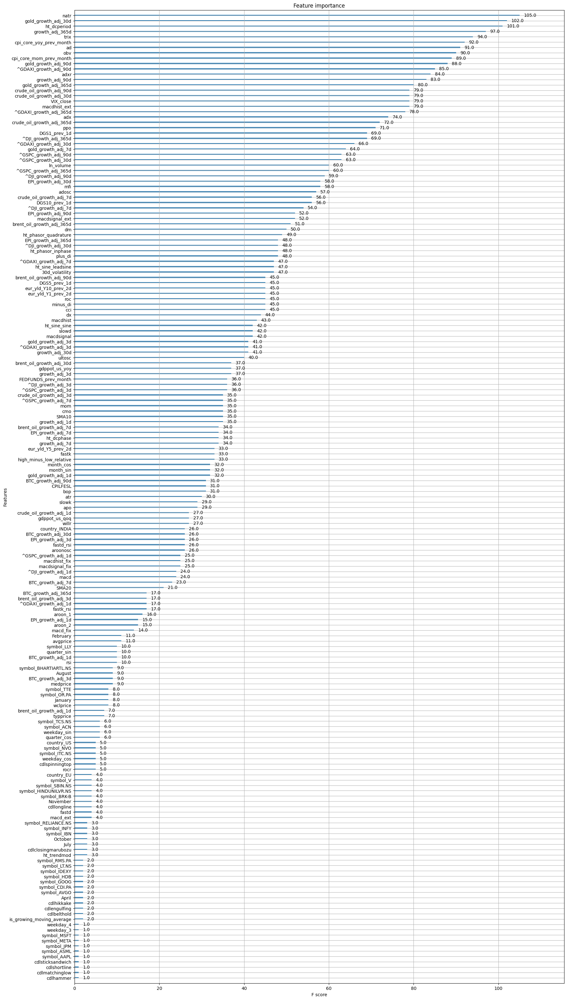

In [67]:
import matplotlib.pyplot as plt
from xgboost import plot_importance


fig, ax = plt.subplots(figsize=(20, 40))

# Plot importance on our axes
plot_importance(clf_xgb, ax=ax, importance_type='weight')

plt.show()

In [68]:
import joblib
import os

os.makedirs(name="../model/",exist_ok=True)
joblib.dump(clf_xgb, "../model/mock_model.joblib")

['../model/mock_model.joblib']

In [69]:
general_df_test.columns.to_list()

['country',
 'region',
 'industry',
 'sector',
 'currency',
 'growth_adj_1d',
 'growth_adj_3d',
 'growth_adj_7d',
 'growth_adj_30d',
 'growth_adj_90d',
 'growth_adj_365d',
 'SMA10',
 'SMA20',
 'is_growing_moving_average',
 'high_minus_low_relative',
 '30d_volatility',
 'is_positive_growth_7d',
 'adx',
 'adxr',
 'apo',
 'aroon_1',
 'aroon_2',
 'aroonosc',
 'bop',
 'cci',
 'cmo',
 'dx',
 'macd',
 'macdsignal',
 'macdhist',
 'macd_ext',
 'macdsignal_ext',
 'macdhist_ext',
 'macd_fix',
 'macdsignal_fix',
 'macdhist_fix',
 'mfi',
 'minus_di',
 'mom',
 'plus_di',
 'dm',
 'ppo',
 'roc',
 'rocp',
 'rocr',
 'rocr100',
 'rsi',
 'slowk',
 'slowd',
 'fastk',
 'fastd',
 'fastk_rsi',
 'fastd_rsi',
 'trix',
 'ultosc',
 'willr',
 'ad',
 'adosc',
 'obv',
 'atr',
 'natr',
 'ht_dcperiod',
 'ht_dcphase',
 'ht_phasor_inphase',
 'ht_phasor_quadrature',
 'ht_sine_sine',
 'ht_sine_leadsine',
 'ht_trendmod',
 'avgprice',
 'medprice',
 'typprice',
 'wclprice',
 'cdl2crows',
 'cdl3blackrows',
 'cdl3inside',
 'cd

In [70]:
general_df["date"] = date
mock_data = general_df[general_df["date"] == general_df["date"].max()].drop(columns=["is_positive_growth_7d"])

mock_data.to_parquet("../src/predict/mock_data.parquet")

In [71]:
mock_data = pd.read_parquet("../src/predict/mock_data.parquet")

In [72]:
mock_data

,country,region,industry,sector,currency,growth_adj_1d,growth_adj_3d,growth_adj_7d,growth_adj_30d,growth_adj_90d,...,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6,country_US,country_EU,country_INDIA,date
index,,,,,,,,,,,,,,,,,,,,,
9785,united_states,US_AMERICA,software-infrastructure,technology,USD,0.995799,0.987736,0.985449,0.935362,1.020719,...,0,0,0,0,0,0,1,0,0,2025-01-13 00:00:00+00:00
102691,india,ASIA,banks-regional,financial-services,INR,0.981500,0.945990,0.939593,0.846681,0.933521,...,0,0,0,0,0,0,0,0,1,2025-01-13 00:00:00+00:00
108294,india,ASIA,engineering-construction,industrials,INR,0.979681,0.963282,0.961451,0.884483,0.980721,...,0,0,0,0,0,0,0,0,1,2025-01-13 00:00:00+00:00
108957,india,ASIA,insurance-life,financial-services,INR,0.963609,0.931005,0.923617,0.861685,0.838812,...,0,0,0,0,0,0,0,0,1,2025-01-13 00:00:00+00:00
114557,india,ASIA,telecom-services,communication-services,INR,0.988427,0.998749,1.005509,1.007062,0.963649,...,0,0,0,0,0,0,0,0,1,2025-01-13 00:00:00+00:00
121855,india,ASIA,household-personal-products,consumer-defensive,INR,1.003665,1.020825,1.031479,1.020676,0.872981,...,0,0,0,0,0,0,0,0,1,2025-01-13 00:00:00+00:00
129150,india,ASIA,oil-gas-refining-marketing,energy,INR,0.998349,0.979731,1.017939,0.969997,0.887287,...,0,0,0,0,0,0,0,0,1,2025-01-13 00:00:00+00:00
134721,india,ASIA,information-technology-services,technology,INR,1.005966,1.044470,1.047888,0.969203,1.011360,...,0,0,0,0,0,0,0,0,1,2025-01-13 00:00:00+00:00
142016,india,ASIA,tobacco,consumer-defensive,INR,0.986851,0.976643,0.991867,0.943686,0.864357,...,0,0,0,0,0,0,0,0,1,2025-01-13 00:00:00+00:00


In [73]:
mock_data.to_dict(orient="list")

{'country': ['united_states',
  'india',
  'india',
  'india',
  'india',
  'india',
  'india',
  'india',
  'india',
  'france',
  'france',
  'france',
  'france',
  'germany'],
 'region': ['US_AMERICA',
  'ASIA',
  'ASIA',
  'ASIA',
  'ASIA',
  'ASIA',
  'ASIA',
  'ASIA',
  'ASIA',
  'EU',
  'EU',
  'EU',
  'EU',
  'EU'],
 'industry': ['software-infrastructure',
  'banks-regional',
  'engineering-construction',
  'insurance-life',
  'telecom-services',
  'household-personal-products',
  'oil-gas-refining-marketing',
  'information-technology-services',
  'tobacco',
  'luxury-goods',
  'household-personal-products',
  'luxury-goods',
  'luxury-goods',
  'specialty-industrial-machinery'],
 'sector': ['technology',
  'financial-services',
  'industrials',
  'financial-services',
  'communication-services',
  'consumer-defensive',
  'energy',
  'technology',
  'consumer-defensive',
  'consumer-cyclical',
  'consumer-defensive',
  'consumer-cyclical',
  'consumer-cyclical',
  'industrial

In [74]:
pd.DataFrame(mock_data.to_dict(orient="records"))

,country,region,industry,sector,currency,growth_adj_1d,growth_adj_3d,growth_adj_7d,growth_adj_30d,growth_adj_90d,...,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6,country_US,country_EU,country_INDIA,date
0,united_states,US_AMERICA,software-infrastructure,technology,USD,0.995799,0.987736,0.985449,0.935362,1.020719,...,0,0,0,0,0,0,1,0,0,2025-01-13 00:00:00+00:00
1,india,ASIA,banks-regional,financial-services,INR,0.981500,0.945990,0.939593,0.846681,0.933521,...,0,0,0,0,0,0,0,0,1,2025-01-13 00:00:00+00:00
2,india,ASIA,engineering-construction,industrials,INR,0.979681,0.963282,0.961451,0.884483,0.980721,...,0,0,0,0,0,0,0,0,1,2025-01-13 00:00:00+00:00
3,india,ASIA,insurance-life,financial-services,INR,0.963609,0.931005,0.923617,0.861685,0.838812,...,0,0,0,0,0,0,0,0,1,2025-01-13 00:00:00+00:00
4,india,ASIA,telecom-services,communication-services,INR,0.988427,0.998749,1.005509,1.007062,0.963649,...,0,0,0,0,0,0,0,0,1,2025-01-13 00:00:00+00:00
5,india,ASIA,household-personal-products,consumer-defensive,INR,1.003665,1.020825,1.031479,1.020676,0.872981,...,0,0,0,0,0,0,0,0,1,2025-01-13 00:00:00+00:00
6,india,ASIA,oil-gas-refining-marketing,energy,INR,0.998349,0.979731,1.017939,0.969997,0.887287,...,0,0,0,0,0,0,0,0,1,2025-01-13 00:00:00+00:00
7,india,ASIA,information-technology-services,technology,INR,1.005966,1.044470,1.047888,0.969203,1.011360,...,0,0,0,0,0,0,0,0,1,2025-01-13 00:00:00+00:00
8,india,ASIA,tobacco,consumer-defensive,INR,0.986851,0.976643,0.991867,0.943686,0.864357,...,0,0,0,0,0,0,0,0,1,2025-01-13 00:00:00+00:00
9,france,EU,luxury-goods,consumer-cyclical,EUR,0.999174,1.008333,1.012552,1.001656,0.988826,...,0,0,0,0,0,0,0,1,0,2025-01-13 00:00:00+00:00
